# ‘Ddareungi’ Seoul's city bike-sharing system
* Background:\
This service tarted back at 2015 and today has more than 20,000 bikes at 1,500 locations in city.
The service usage is doubling each year, with 52,000 daily rentals and more then 3M users as of this year (2021).
* Objective:\
Trip duration is the most fundamental measure in all modes of transportation. Predicting the trip-time precisely is crucial for advanced Intelligent Transport Systems (ITS) and traveler information systems.
* Data source:\
Kaggle - Original data from the bike sharing system + local weather information




In [ ]:
!pip install plotly
!pip install cufflinks
!pip install datatable

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import cufflinks as cf
cf.go_offline()
import plotly.io as pio
import datatable as dt
%matplotlib inline

## Data import and preprocess

In [280]:
df = dt.fread('Seoul Bike.csv').to_pandas() # Using datatable library to speed up loading time of 1.3GB file size

In [281]:
df.drop(columns=['C0'],inplace=True)
df.columns = df.columns.str.lower()
df.head(3)

,duration,distance,plong,platd,dlong,dlatd,haversine,pmonth,pday,phour,...,dmin,ddweek,temp,precip,wind,humid,solar,snow,groundtemp,dust
0,3,50,37.544666,126.888359,37.544666,126.888359,0.000000,1,1,0,...,4,0,-3.2,0.0,0.5,40.0,0.0,0.0,-2.2,25.0
1,24,7670,37.506199,127.003944,37.551250,127.035103,5.713529,1,1,0,...,25,0,-3.2,0.0,0.5,40.0,0.0,0.0,-2.2,25.0
2,8,1390,37.544590,127.057083,37.537014,127.061096,0.913702,1,1,0,...,9,0,-3.2,0.0,0.5,40.0,0.0,0.0,-2.2,25.0


* Dropped columns: with same data, ones highly correlated and others which did not seam to be of value predicting the duration.

In [282]:
# Drop unnecessary columns (highly correlated and with same values)
df.drop(['pmin','dmonth','dday','dhour','dmin','ddweek','haversine','plong','platd','dlong','dlatd','groundtemp'], axis=1, inplace=True)

In [406]:
# Sampling the dataset due to it's large size, to aid in EDA analysis
sample_df = df.sample(int(len(df)*0.05))

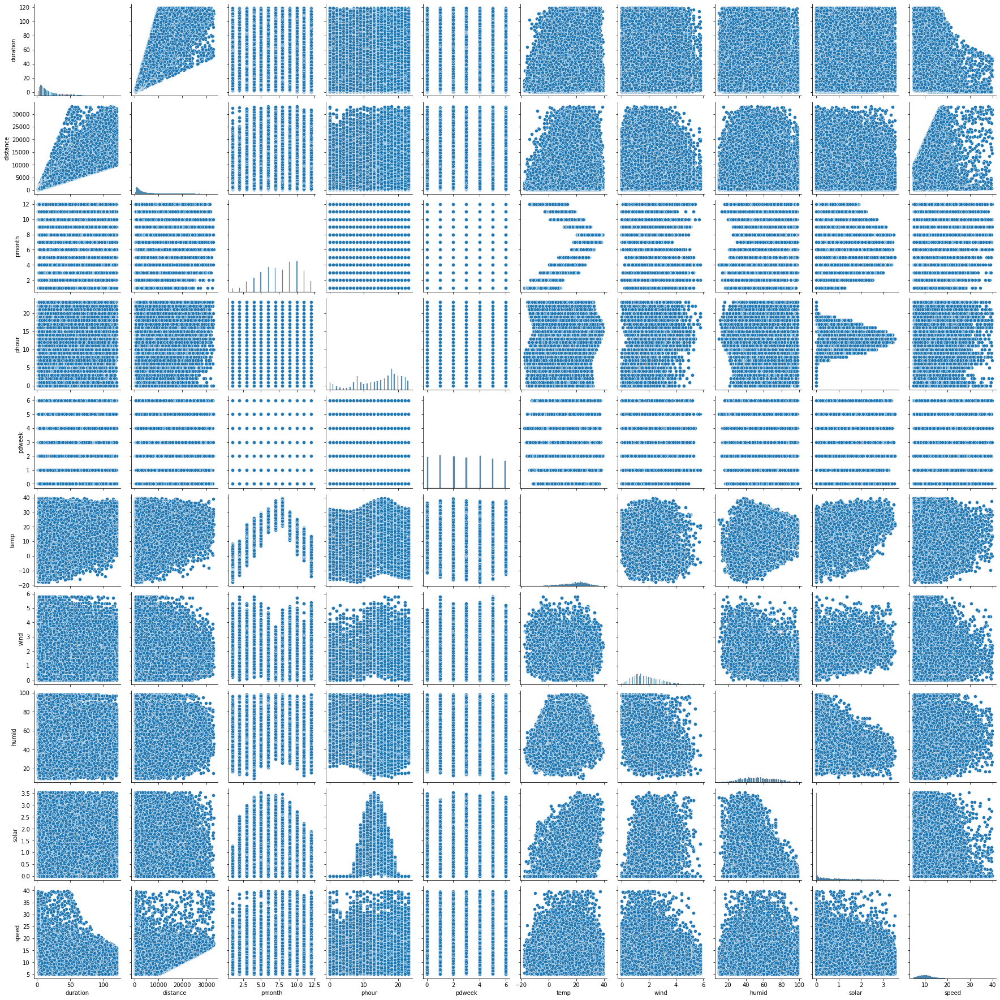

In [427]:
sns.pairplot(sample_df);

In [374]:
sample_df.corr().abs().iplot(kind='heatmap', colorscale='-YlGnBu', title='Matrix heatmap correlation')

## Feature engineering and outliers removal

In [407]:
# Add new column calculating bikes speed to aid in identifying outliers relating to distance and duration
sample_df['speed'] = (sample_df.distance/1000)/(sample_df.duration/60)

In [422]:
# Removing outliers from data
sample_df = sample_df[sample_df.dust < 180]
sample_df = sample_df[sample_df.snow < 4]
sample_df = sample_df[sample_df.precip < 22]
sample_df = sample_df[sample_df.wind < 6]
sample_df = sample_df[sample_df.distance > 180]
sample_df = sample_df[(sample_df.speed < 40) & (sample_df.speed > 5)]

## Visualizations and analysis

In [424]:
x = sample_df.groupby('phour')[['duration']].mean().reset_index()
fig = px.area(x, x='phour', y='duration', markers=True, range_x=[0,23], range_y=[10,32],
             title='Average rental duration vs. hour of day',
             labels={'phour':'Hours', 'duration':'Duration (min)'})
fig.add_annotation(x=6, y=18.5,
            text="Morning rush hours(6-8)",
            bgcolor='orange',
            bordercolor='black',
            showarrow=True,
            ax = 5,
            ay = 15,
            axref="x",
            ayref='y',
            arrowsize=2,
            arrowhead=1,
            font=dict(
                color="black",
                size=16))
fig.add_annotation(x=17, y=28.5,
            text="Afternoon rush hours(16-18)",
            bgcolor='orange',
            bordercolor='black',
            showarrow=True,
            ax = 16,
            ay = 25,
            axref="x",
            ayref='y',
            arrowsize=2,
            arrowhead=1,
            font=dict(
                color="black",
                size=16))
fig.add_annotation(x=19, y=28.5,
            text="Evening leisure time",
            bgcolor='yellow',
            bordercolor='black',
            showarrow=True,
            ax = 20,
            ay = 20,
            axref="x",
            ayref='y',
            arrowsize=2,
            arrowhead=1,
            font=dict(
                color="black",
                size=16))                
fig.update_layout(xaxis = dict(tickmode = 'linear')).show()

In [425]:
x = sample_df.groupby('pdweek')[['duration']].mean().reset_index()
fig = px.area(x, x='pdweek', y='duration', markers=True, range_x=[0,6], range_y=[22,31],
             title='Average rental duration vs. day of week', 
             labels={'pdweek':'Day of week', 'duration':'Duration (min)'})
fig.update_layout(xaxis = 
                    dict(tickmode = 'array', 
                    tickvals = [0, 1, 2, 3, 4, 5, 6],
                    ticktext = ['Monday', 'Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']))
fig.show()

In [189]:
from plotly.subplots import make_subplots
x = sample_df.groupby('pmonth')[['duration','temp']].mean().reset_index()

subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig1 = px.line(x, x='pmonth', y=['duration'], markers=True, range_x=[0,12])
fig2 = px.line(x, x='pmonth', y=['temp'], markers=True, range_x=[0,12])                   
fig1.update_traces(name='Duration (min)')
fig2.update_traces(yaxis='y2', name='Temperature')
subfig.add_traces(fig1.data + fig2.data)
subfig.update_layout(xaxis = 
                    dict(tickmode = 'array', 
                    tickvals = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                    ticktext = ['Jan', 'Feb', 'Mar', 'Apr', 'May','Jun','Jul', 'Aug','Sep', 'Oct','Nov', 'Dec']),
                    legend= dict(title=None, orientation="h", y=1, yanchor="bottom", x=0.5, xanchor="center"))
subfig.layout.title='Average duration vs. Month and Temperature'
subfig.layout.xaxis.title='Months'
subfig.layout.yaxis.title='Duration (min)'
subfig.layout.yaxis2.title='Temperature'
subfig.for_each_trace(lambda t: t.update(line=dict(color=t.marker.color)))
subfig.show()

In [431]:
fig = px.histogram(sample_df.duration, title='Bikes rental time duration distribution', labels={'value':'Minutes'})
fig.add_annotation(x=60, y=500,
            text="End of first hour use",
            bgcolor='orange',
            bordercolor='black',
            showarrow=True,
            ax = 58,
            ay = 6000,
            axref="x",
            ayref='y',
            arrowsize=2,
            arrowhead=1,
            font=dict(
                color="black",
                size=16))
fig.add_annotation(x=118, y=200,
            text="End of second hour use",
            bgcolor='orange',
            bordercolor='black',
            showarrow=True,
            ax = 105,
            ay = 6000,
            axref="x",
            ayref='y',
            arrowsize=2,
            arrowhead=1,
            font=dict(
                color="black",
                size=16))
fig.update_layout(xaxis = 
                    dict(tickmode = 'array',
                    tickvals = [0, 10, 20, 30, 40, 50, 60,70, 80, 90, 100, 110, 119]))                              
fig.show()

## ML Regression models (LR, DTR, KNN)

In [286]:
# Import regression models
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OrdinalEncoder, FunctionTransformer, OneHotEncoder, MinMaxScaler, MaxAbsScaler, StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as MSE, mean_squared_log_error as MSLE

### Preparing 'clean' dataset and splitting to train and test datasets

In [423]:
# Prepare data set for models, creating bins for specific columns
sample_df.drop(['pday'], axis=1, inplace=True)
df_cleaned = sample_df
df_cleaned['snow'] = pd.cut(df_cleaned.snow, bins=[0, 0.01, 2, 1e6], include_lowest=True, labels=['No snow', 'light snow', 'heavy snow'])
df_cleaned['precip'] = pd.cut(df_cleaned.precip, bins=[0, 0.01, 5, 20, 1e6], include_lowest=True, labels=['No rain', 'drizel', 'light rain', 'heavy rain'])
df_cleaned['dust'] = pd.cut(df_cleaned.dust, bins=[0, 0.01, 100, 1e6], include_lowest=True, labels=['No dust', 'dust', 'pollutant'])
df_cleaned = df_cleaned.drop('speed', axis=1)

In [424]:
# Split data set to train and test
X = df_cleaned.drop(['duration'], axis=1)
y = df_cleaned[['duration']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Scalars ,models and pipeline instantiation

In [425]:
# instantiate scalars and transformers
one = OrdinalEncoder(categories=[['No snow', 'light snow', 'heavy snow'],['No rain', 'drizel', 'light rain', 'heavy rain'],['No dust', 'dust', 'pollutant']])
maxabs = MaxAbsScaler()

column_transform = make_column_transformer(
                                            (one, ['snow', 'precip', 'dust']),
                                            (maxabs, ['distance', 'phour', 'pmonth', 'pdweek', 'wind', 'humid', 'solar', 'temp']), remainder='passthrough'
                                            )
# chose which model you want to use and comment out the other models
# dtr = DecisionTreeRegressor(min_samples_leaf=0.01 ,criterion='squared_error', random_state=42)
# knn = KNeighborsRegressor(n_neighbors=11, algorithm='auto' ,n_jobs=-1)
lr = LinearRegression(n_jobs=-1)
pipe = make_pipeline(column_transform, lr) # set the name of the model to run

maxabs_y = MaxAbsScaler()
y_train_scaled = maxabs_y.fit_transform(y_train) # scaling y_train and y_test
y_test_scaled = maxabs_y.transform(y_test)

pipe.fit(X_train, y_train_scaled);

### Scoring models with RMSE

In [426]:
# Calculate RMSE score for train and test data
y_train_pred = pipe.predict(X_train)
RMSE_train = MSE(maxabs_y.inverse_transform(y_train_scaled).squeeze(), 
                 maxabs_y.inverse_transform(y_train_pred.reshape(-1, 1)))**0.5
                 
y_test_pred = pipe.predict(X_test)
RMSE_test = MSE(maxabs_y.inverse_transform(y_test_scaled).squeeze(), 
                 maxabs_y.inverse_transform(y_test_pred.reshape(-1, 1)))**0.5
print('RMSE scourings: Train set - {:.3}, Test set - {:.3}, Difference: {:.2%}'.format(RMSE_train, RMSE_test, (RMSE_test-RMSE_train)/RMSE_test))

RMSE scourings: Train set - 9.58, Test set - 9.6, Difference: 0.21%


In [431]:
# Transforming back scaled train prediction to original values
y_train_pred_inverse = maxabs_y.inverse_transform(y_train_pred)
y_train_pred_inverse = pd.DataFrame(y_train_pred_inverse, index=y_train.index, columns=['pred'])
combined_df = y_train_pred_inverse.merge(y_train, left_index=True, right_index=True)
combined_df.head(15)

,pred,duration
186998,12.141386,11
3973541,14.479646,12
6488476,20.607773,34
4153336,22.553031,30
656582,7.318693,7
3384133,18.330433,18
3839701,8.706443,3
4566751,9.620120,4
7045497,11.369510,12
7824682,6.208721,6


<AxesSubplot:xlabel='duration', ylabel='pred'>

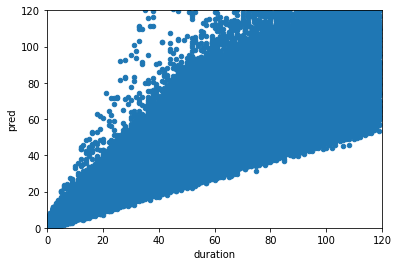

In [430]:
combined.plot.scatter(x='duration', y='pred', xlim=[0,120], ylim=[0, 120])

In [28]:
# user defined metric function for KNN model
def my_distance(ride1, ride2):
    d_distance = ride1[0] - ride2[0]
    d_pmonth = ride1[1] - ride2[1]
    d_phour = ride1[2] - ride2[2]
    d_pdweek = ride1[3] - ride2[3]
    d_precip = ride1[4] - ride2[4]
    d_wind = ride1[5] - ride2[5]
    d_humid = ride1[6] - ride2[6]
    d_solar = ride1[7] - ride2[7]
    d_snow = ride1[8] - ride2[8]
    d_temp = ride1[9] - ride2[9]
    d_dust = ride1[10] - ride2[10]
    return 0.01*d_distance + 0.01*d_pmonth + 3*d_phour+ 1*d_pdweek+ 0.01*d_precip+ 0.01*d_wind+ 0.01*d_humid+ 0.01*d_solar+ 0.01*d_temp+ 2*d_dust